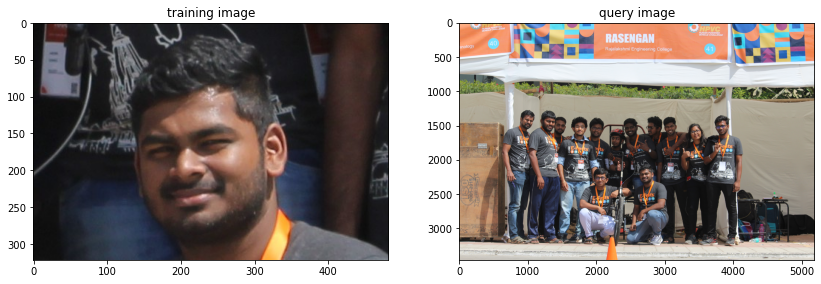

In [51]:
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['figure.figsize'] = [14.0, 7.0]


train_image = cv2.imread("/content/train_image3.jpg")

query_image = cv2.imread("/content/20200301014151_IMG_9254.JPG")

train_image = cv2.cvtColor(train_image, cv2.COLOR_BGR2RGB)

query_image = cv2.cvtColor(query_image, cv2.COLOR_BGR2RGB)

training_gray = cv2.cvtColor(train_image, cv2.COLOR_RGB2GRAY)

query_gray = cv2.cvtColor(query_image, cv2.COLOR_RGB2GRAY)

plt.subplot(121)
plt.title("training image")
plt.imshow(train_image)

plt.subplot(122)
plt.title("query image")
plt.imshow(query_image)



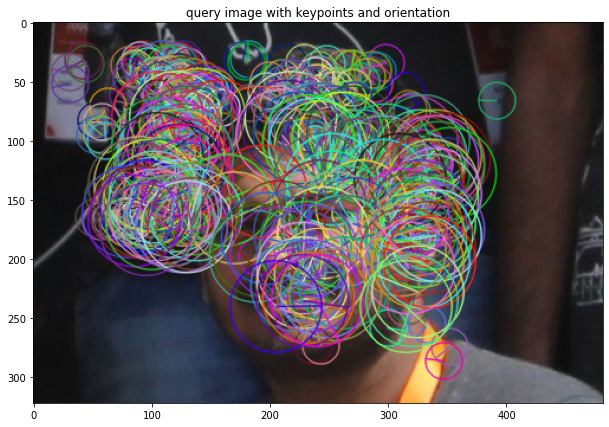

In [52]:
train_image_keyp = copy.copy(train_image)
cv2.drawKeypoints(train_image, keypoints_train, train_image_keyp, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.title("query image with keypoints and orientation")
plt.imshow(train_image_keyp)
plt.show()

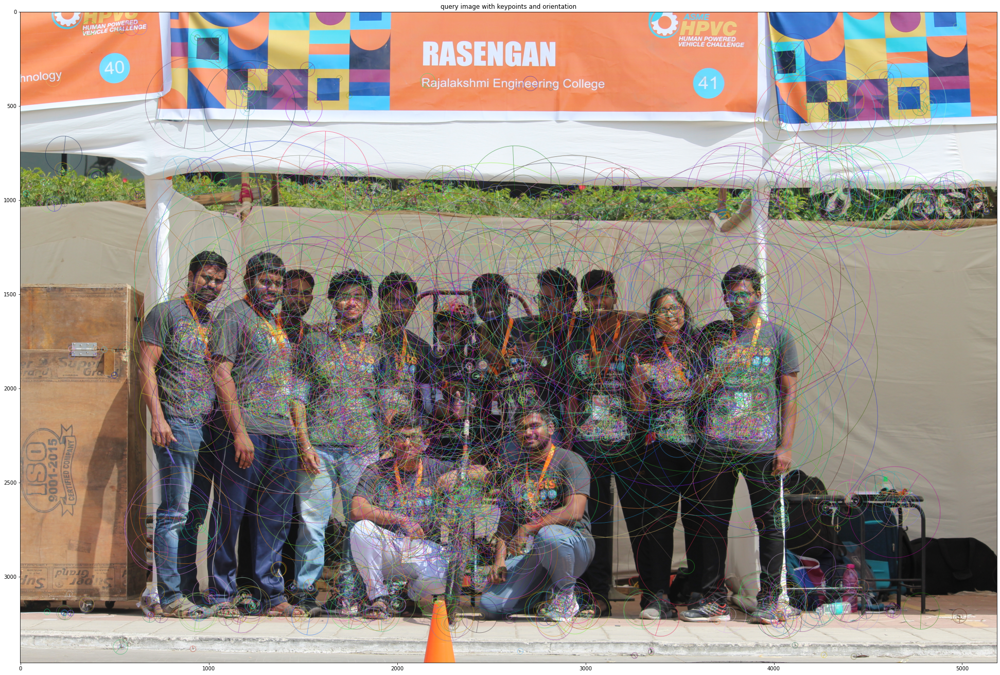

In [56]:
plt.rcParams['figure.figsize'] = [34.0, 34.0]

orb = cv2.ORB_create(7000, 2.5)

keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

import copy

query_image_keyp = copy.copy(query_image)

cv2.drawKeypoints(query_image, keypoints_query, query_image_keyp, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.title("query image with keypoints and orientation")
plt.imshow(query_image_keyp)
plt.show()


In [37]:
print('\nNumber of keypoints in query image: ',len(keypoints_query))


Number of keypoints in query image:  4941


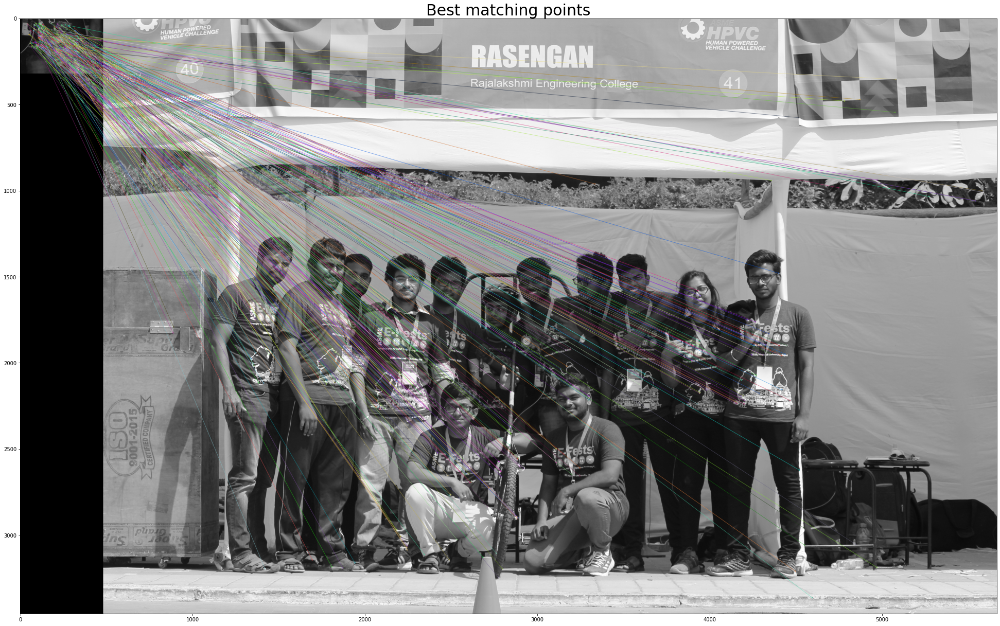

In [48]:
plt.rcParams['figure.figsize'] = [34.0, 34.0]

bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

matches = bf.match(descriptors_train, descriptors_query)

matches = sorted(matches, key = lambda x: x.distance)

result = cv2.drawMatches(training_gray, keypoints_train, query_gray, keypoints_query, matches, query_gray, flags = 2)

plt.title("Best matching points", fontsize = 30)
plt.imshow(result)
plt.show()

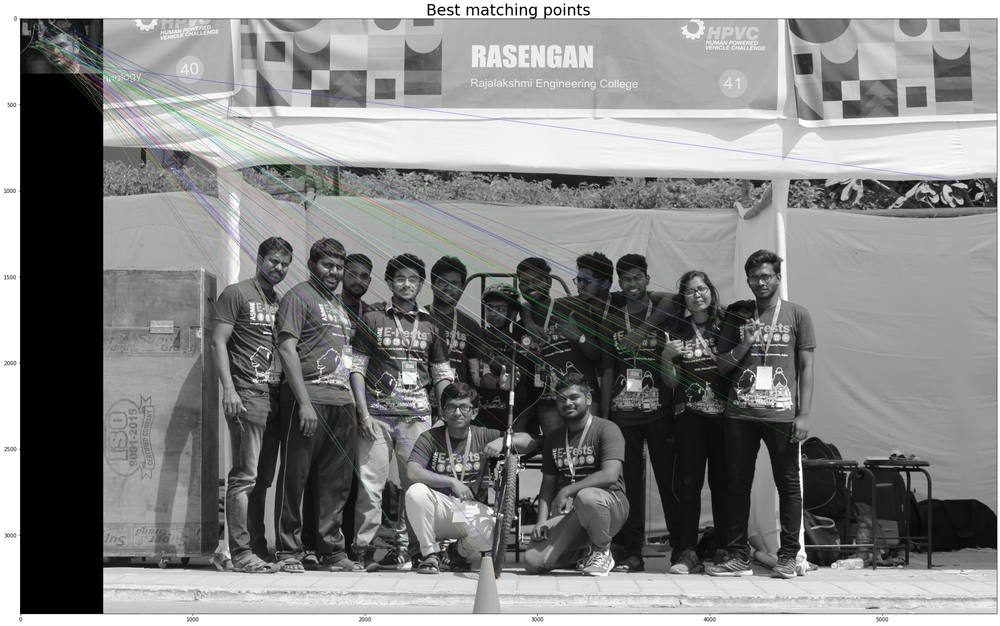

In [41]:
result = cv2.drawMatches(training_gray, keypoints_train, query_gray, keypoints_query, matches[:85], query_gray, flags = 2)
plt.title("Best matching points", fontsize = 30)
plt.imshow(result)
plt.show()

In [49]:
print("Number of Keypoints Detected In The Training Image: ", len(keypoints_train))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(keypoints_query))

# Print total number of matching Keypoints between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

Number of Keypoints Detected In The Training Image:  489
Number of Keypoints Detected In The Query Image:  4952

Number of Matching Keypoints Between The Training and Query Images:  283
